# ADP Projekt: Analiza zmiany populacji w Polsce w latach 2002-2014

## zaimportowanie potrzebnych bibliotek

In [54]:
import pandas as pd
import geopandas as gpd
import folium
from geopandas.tools import geocode
import mapclassify

## Import danych i bazowa wizualizacja

### zaimportowanie danych o zagęszczeniu populacji w 2002

In [2]:
pop_2002_df = pd.read_csv("pop_2002.csv", delimiter=",")
pop_2002_gdf = gpd.GeoDataFrame(pop_2002_df,
                                geometry = gpd.points_from_xy(pop_2002_df['X'], pop_2002_df['Y']),
                                crs = 'EPSG:4326')
display(pop_2002_gdf)
display(pop_2002_gdf['geometry'].crs)

,X,Y,Z,geometry
0,18.277917,54.837083,162.110504,POINT (18.27792 54.83708)
1,18.286250,54.837083,258.713379,POINT (18.28625 54.83708)
2,18.294583,54.837083,460.313843,POINT (18.29458 54.83708)
3,18.302917,54.837083,558.097290,POINT (18.30292 54.83708)
4,18.311250,54.837083,426.975342,POINT (18.31125 54.83708)
...,...,...,...,...
589141,22.886250,49.028750,96.188911,POINT (22.88625 49.02875)
589142,22.869583,49.020417,6.423973,POINT (22.86958 49.02042)
589143,22.877917,49.020417,10.752447,POINT (22.87792 49.02042)
589144,22.886250,49.020417,23.253744,POINT (22.88625 49.02042)


<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

### wyświetlenie mapy zagęszczenia populacji z 2002

Text(0.5, 1.0, 'Populacja w roku 2002')

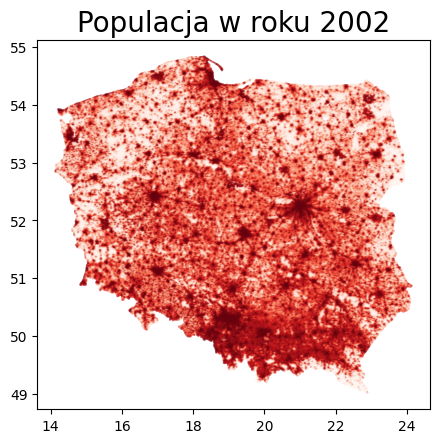

In [3]:
pop_2002_plot = pop_2002_gdf.plot(column="Z",
                                  cmap='Reds',
                                  scheme='quantiles',
                                  k=200,
                                  markersize=0.005)
pop_2002_plot.set_title("Populacja w roku 2002",
                        fontsize=20)

### zaimportowanie danych o zagęszczeniu populacji w 2014

In [4]:
pop_2014_df = pd.read_csv("pop_2014.csv", delimiter=",")
pop_2014_gdf = gpd.GeoDataFrame(pop_2014_df,
                                geometry = gpd.points_from_xy(pop_2014_df['X'], pop_2014_df['Y']),
                                crs = 'EPSG:4326')
display(pop_2014_gdf)
display(pop_2014_gdf['geometry'].crs)

,X,Y,Z,geometry
0,18.277917,54.837083,80.274429,POINT (18.27792 54.83708)
1,18.286250,54.837083,218.889404,POINT (18.28625 54.83708)
2,18.294583,54.837083,549.681335,POINT (18.29458 54.83708)
3,18.302917,54.837083,793.345703,POINT (18.30292 54.83708)
4,18.311250,54.837083,550.715027,POINT (18.31125 54.83708)
...,...,...,...,...
589141,22.886250,49.028750,62.005821,POINT (22.88625 49.02875)
589142,22.869583,49.020417,5.359766,POINT (22.86958 49.02042)
589143,22.877917,49.020417,8.434938,POINT (22.87792 49.02042)
589144,22.886250,49.020417,22.993496,POINT (22.88625 49.02042)


<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

### wyświetlenie mapy zagęszczenia populacji z 2014

Text(0.5, 1.0, 'Populacja w roku 2014')

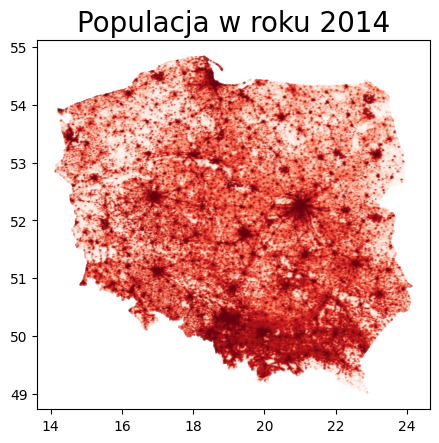

In [5]:
pop_2014_plot = pop_2014_gdf.plot(column="Z",
                                  cmap='Reds',
                                  scheme='quantiles',
                                  k=200,
                                  markersize=0.005)
pop_2014_plot.set_title("Populacja w roku 2014",
                        fontsize=20)

### utworzenie danych o różnicy zagęszczenia populacji między latami 2002-2014

In [47]:
pop_diff_df = pop_2014_df[["X", "Y"]]
pop_diff_df["Z"] = pop_2014_df[["Z"]] - pop_2002_df[["Z"]]
pop_diff_gdf = gpd.GeoDataFrame(pop_diff_df,
                                geometry = gpd.points_from_xy(pop_diff_df['X'], pop_diff_df['Y']),
                                crs = 'EPSG:4326')
display(pop_diff_gdf)
display(pop_diff_gdf['geometry'].crs)

,X,Y,Z,geometry
0,18.277917,54.837083,-81.836075,POINT (18.27792 54.83708)
1,18.286250,54.837083,-39.823975,POINT (18.28625 54.83708)
2,18.294583,54.837083,89.367493,POINT (18.29458 54.83708)
3,18.302917,54.837083,235.248413,POINT (18.30292 54.83708)
4,18.311250,54.837083,123.739685,POINT (18.31125 54.83708)
...,...,...,...,...
589141,22.886250,49.028750,-34.183090,POINT (22.88625 49.02875)
589142,22.869583,49.020417,-1.064207,POINT (22.86958 49.02042)
589143,22.877917,49.020417,-2.317509,POINT (22.87792 49.02042)
589144,22.886250,49.020417,-0.260248,POINT (22.88625 49.02042)


<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

### wyświetlenie mapy różnicy zagęszczenia populacji między latami 2002-2014

Text(0.5, 1.0, 'Różnice populacji między 2002-2014')

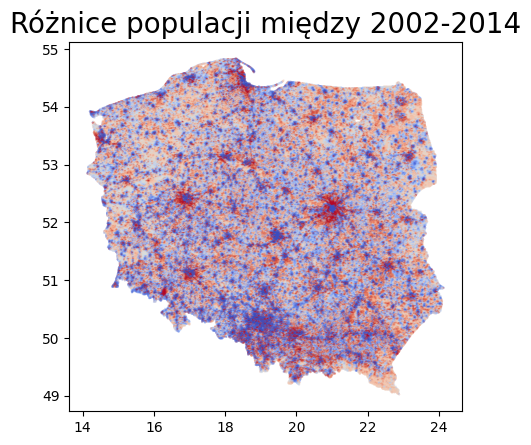

In [48]:
pop_diff_plot = pop_diff_gdf.plot(column="Z",
                                  cmap='coolwarm',
                                  scheme='quantiles',
                                  k=200,
                                  markersize=0.005)
pop_diff_plot.set_title("Różnice populacji między 2002-2014",
                        fontsize=20)

### zaimportowanie pliku shapefile zawierającego województwa

In [8]:
wojewodztwa_gdf = gpd.read_file("wojewodztwa/wojewodztwa.shp")
wojewodztwa_gdf = wojewodztwa_gdf[['JPT_NAZWA_', 'geometry']]
wojewodztwa_gdf.rename(columns={'JPT_NAZWA_': 'region'}, inplace=True)
wojewodztwa_gdf['region'] = wojewodztwa_gdf['region'].str.upper()
wojewodztwa_gdf = wojewodztwa_gdf.sort_values(by='region')
wojewodztwa_gdf.reset_index(inplace=True, drop=True)
display(wojewodztwa_gdf)

,region,geometry
0,DOLNOŚLĄSKIE,"POLYGON ((351910.997 289041.305, 351818.002 28..."
1,KUJAWSKO-POMORSKIE,"POLYGON ((441690.785 515930.957, 441653.937 51..."
2,LUBELSKIE,"POLYGON ((854896.590 294722.020, 854350.170 29..."
3,LUBUSKIE,"POLYGON ((249058.528 411232.826, 249030.522 41..."
4,MAZOWIECKIE,"POLYGON ((622867.975 604854.016, 622903.960 60..."
5,MAŁOPOLSKIE,"POLYGON ((631316.899 166704.316, 631331.032 16..."
6,OPOLSKIE,"POLYGON ((410362.990 269639.399, 410366.160 26..."
7,PODKARPACKIE,"POLYGON ((819920.700 271467.820, 819598.610 27..."
8,PODLASKIE,"POLYGON ((795031.423 692192.565, 794882.820 69..."
9,POMORSKIE,"POLYGON ((488665.467 751328.589, 488780.891 75..."


### zmiana crs dla województw aby zgadzał się z tym w dataframeach zaimportowanych w późniejszych komórkach

In [9]:
display(wojewodztwa_gdf["geometry"].crs)
wojewodztwa_gdf["geometry"] = wojewodztwa_gdf["geometry"].to_crs("EPSG:4326")
display(wojewodztwa_gdf["geometry"].crs)

<Projected CRS: EPSG:2180>
Name: ETRF2000-PL / CS92
Axis Info [cartesian]:
- x[north]: Northing (metre)
- y[east]: Easting (metre)
Area of Use:
- name: Poland - onshore and offshore.
- bounds: (14.14, 49.0, 24.15, 55.93)
Coordinate Operation:
- name: Poland CS92
- method: Transverse Mercator
Datum: ETRF2000 Poland
- Ellipsoid: GRS 1980
- Prime Meridian: Greenwich

<Geographic 2D CRS: EPSG:4326>
Name: WGS 84
Axis Info [ellipsoidal]:
- Lat[north]: Geodetic latitude (degree)
- Lon[east]: Geodetic longitude (degree)
Area of Use:
- name: World.
- bounds: (-180.0, -90.0, 180.0, 90.0)
Datum: World Geodetic System 1984 ensemble
- Ellipsoid: WGS 84
- Prime Meridian: Greenwich

### wyświetlenie granic województw

<Axes: >

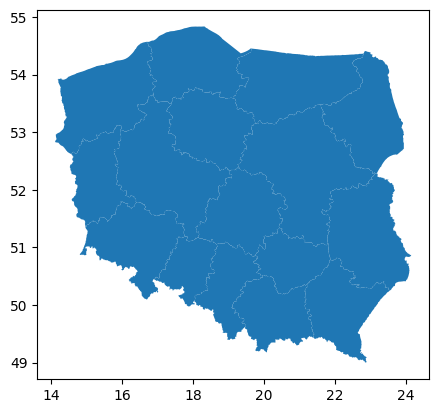

In [10]:
wojewodztwa_gdf.plot()

### zaimportwanie danych o urodzeniach w latach 2002-2014 oraz modulacje aby dataframe miał odpowiednią formę 

In [11]:
columns = ['region', 'total']
births_df = pd.read_csv('uro_2002.csv', delimiter=',', usecols=columns)
births_df['region'] = births_df['region'].str.replace(' ', '')
births_df['total'] = births_df['total'].astype(int)
births_df.rename(columns={'total': 2002}, inplace=True)

year = 2003
while year <= 2014:
    filename = 'uro_' + str(year) + '.csv'
    births_df[year] = pd.read_csv(filename, delimiter=',', usecols=['total'])
    births_df[year] = births_df[year].astype(int)
    year += 1

births_df['sum'] = births_df.values[:,1:].sum(axis =1)

display(births_df)

,region,2002,2003,2004,2005,2006,2007,2008,2009,2010,2011,2012,2013,2014,sum
0,DOLNOŚLĄSKIE,24588,24103,25046,25872,26696,27737,29995,29964,29663,27772,27353,25914,27268,351971
1,KUJAWSKO-POMORSKIE,20238,20226,20158,20544,21212,21902,23349,23143,22686,21059,20857,19926,20100,275400
2,LUBELSKIE,20908,21346,20893,21415,21591,21881,23109,23065,22725,21448,21297,19810,19885,279373
3,LUBUSKIE,9486,9327,9901,9958,10487,10841,11414,11542,10988,10460,10421,9780,9750,134355
4,ŁÓDZKIE,22258,21889,22595,22698,23505,23988,25639,26175,25625,24071,23951,22501,22776,307671
5,MAŁOPOLSKIE,32451,32018,32112,32635,32811,34224,37018,37424,37208,35657,35275,34406,34528,447767
6,MAZOWIECKIE,46627,46791,48581,50195,53003,55389,58963,60106,61024,57499,57493,55611,57341,708623
7,OPOLSKIE,8506,8186,8253,8528,8502,8537,9215,9322,9195,8722,8976,8271,8629,112842
8,PODKARPACKIE,21414,20599,20624,20622,20384,21056,22314,22440,22084,21224,21143,20445,20027,274376
9,PODLASKIE,11318,10848,10740,11063,11092,11247,11994,12257,11972,11199,11199,10650,11077,146656


### zaimportwanie danych o śmierciach w latach 2002-2014 oraz modulacje aby dataframe miał odpowiednią formę 

In [12]:
deaths_df = pd.read_csv("smierci.csv", delimiter=";")

deaths_df = deaths_df.loc[:, ~deaths_df.columns.str.contains('2016')]
deaths_df = deaths_df.loc[:, ~deaths_df.columns.str.contains('2015')]
deaths_df = deaths_df.loc[:, ~deaths_df.columns.str.contains('Unnamed')]
deaths_df = deaths_df.drop(columns=['Kod'])
deaths_df.rename(columns={'Nazwa': 'region'}, inplace=True)

string_to_check = 'brak przyczyny zgonu (opisu) w Karcie Statystycznej do Karty'
columns_to_drop = [col for col in deaths_df.columns if string_to_check in col]
deaths_df = deaths_df.drop(columns=columns_to_drop)

for col in deaths_df.columns:
    if col == 'region':
        continue
    name = col.replace(';[-]', '')
    deaths_df = deaths_df.rename(columns={col: name})

deaths_df = deaths_df[deaths_df['region'].isin(births_df['region'])]
display(deaths_df)

,region,razem;2002,razem;2003,razem;2004,razem;2005,razem;2006,razem;2007,razem;2008,razem;2009,razem;2010,...,pozostałe przyczyny;2005,pozostałe przyczyny;2006,pozostałe przyczyny;2007,pozostałe przyczyny;2008,pozostałe przyczyny;2009,pozostałe przyczyny;2010,pozostałe przyczyny;2011,pozostałe przyczyny;2012,pozostałe przyczyny;2013,pozostałe przyczyny;2014
1,DOLNOŚLĄSKIE,27456.0,27962.0,28402.0,28603.0,29082.0,29815.0,30464.0,30872.0,29721.0,...,47.0,75.0,61.0,59.0,130.0,205.0,207.0,287.0,44.0,98.0
33,KUJAWSKO-POMORSKIE,19036.0,19241.0,19129.0,19411.0,19622.0,20327.0,20027.0,20389.0,20453.0,...,66.0,67.0,84.0,117.0,113.0,97.0,9.0,3.0,3.0,7.0
57,LUBELSKIE,22731.0,22807.0,22797.0,23182.0,22678.0,23322.0,23428.0,23703.0,23037.0,...,219.0,221.0,230.0,214.0,162.0,29.0,12.0,19.0,68.0,66.0
82,LUBUSKIE,8646.0,9026.0,8925.0,9135.0,9275.0,9452.0,9572.0,9780.0,9488.0,...,51.0,96.0,104.0,74.0,8.0,9.0,5.0,44.0,10.0,3.0
97,ŁÓDZKIE,30589.0,30868.0,30463.0,31273.0,31343.0,32000.0,31498.0,31916.0,31221.0,...,253.0,270.0,312.0,264.0,194.0,190.0,217.0,216.0,233.0,249.0
122,MAŁOPOLSKIE,27807.0,28716.0,28223.0,28965.0,28697.0,29430.0,29727.0,29840.0,29633.0,...,33.0,32.0,14.0,7.0,46.0,140.0,169.0,207.0,171.0,175.0
145,MAZOWIECKIE,51080.0,52533.0,51307.0,51743.0,52092.0,52840.0,53248.0,54630.0,53389.0,...,238.0,263.0,178.0,200.0,150.0,114.0,111.0,121.0,144.0,143.0
188,OPOLSKIE,9288.0,9450.0,9192.0,9471.0,9421.0,9622.0,9809.0,9718.0,9882.0,...,10.0,1.0,0.0,1.0,2.0,4.0,6.0,3.0,2.0,4.0
201,PODKARPACKIE,17970.0,17921.0,17965.0,18289.0,17563.0,17910.0,18225.0,18675.0,18288.0,...,82.0,103.0,146.0,107.0,168.0,7.0,8.0,0.0,1.0,4.0
227,PODLASKIE,11439.0,11735.0,11728.0,11854.0,11879.0,11742.0,11641.0,12165.0,11814.0,...,216.0,148.0,169.0,121.0,46.0,76.0,82.0,88.0,100.0,110.0


### rozdzielenie danych o śmierciach w latach 2002-2014 pod kątem przyczyny śmierci

In [66]:
death_causes = []
for col in deaths_df.columns:
    death_causes.append(col.split(';')[0])
death_causes = set(death_causes)
death_causes.remove('region')

cause_dict = {}
for cause in death_causes:
    selected_columns = [col for col in deaths_df.columns if cause in col]
    df = deaths_df[selected_columns]
    df.columns = df.columns.str.split(';', n=2, expand=True)
    df = df.astype(int)
    df.insert(0, 'region', deaths_df['region'])
    df['sum'] = df.values[:,1:].sum(axis =1)
    df.reset_index(inplace=True, drop=True)
    dict = {df.columns[1][0]: df}
    cause_dict.update(dict)

for key, value in cause_dict.items():
    display(cause_dict.get(key))

region choroby układu trawiennego ogółem                    \
                                                     2002  2003  2004  2005   
0          DOLNOŚLĄSKIE                              1209  1186  1290  1435   
1    KUJAWSKO-POMORSKIE                               735   689   733   780   
2             LUBELSKIE                               874   783   853   845   
3              LUBUSKIE                               337   416   415   450   
4               ŁÓDZKIE                              1318  1292  1350  1493   
5           MAŁOPOLSKIE                              1057  1100  1112  1104   
6           MAZOWIECKIE                              2233  2326  2417  2510   
7              OPOLSKIE                               343   367   439   403   
8          PODKARPACKIE                               585   594   638   657   
9             PODLASKIE                               425   469   463   493   
10            POMORSKIE                               763   828   909   962   
11              ŚLĄSKIE                              2105  2171  2293  2466   
12       ŚWIĘTOKRZYSKIE                               467   503   495   497   
13  WARMIŃSKO-MAZURSKIE                               544   404   443   574   
14        WIELKOPOLSKIE                              1204  1175  1204  1244   
15   ZACHODNIOPOMORSKIE                               573   620   604   613   

                                                            sum  
    2006  2007  2008  2009  2010  2011  2012  2013  2014         
0   1381  1481  1556  1321  1272  1212  1338  1277  1244  17202  
1    782   813   832   812   759   838   771   836   603   9983  
2    796   876   898   889   857   887   760   827   811  10956  
3    393   391   428   457   415   446   409   426   321   5304  
4   1630  1634  1571  1528  1467  1504  1541  1538  1447  19313  
5   1103  1124  1155  1132  1137  1158  1173  1179  1101  14635  
6   2403  2393  2433  2562  2452  2520  2574  2508  2352  31683  
7    355   298   376   347   383   377   408   409   410   4915  
8    609   639   624   601   623   713   629   659   514   8085  
9    543   480   519   543   506   505   491   497   520   6454  
10   928   931   890   886   908   852   976   955   982  11770  
11  2398  2612  2637  2584  2448  2392  2506  2484  2321  31417  
12   488   514   531   454   527   524   497   440   409   6346  
13   546   552   515   563   470   498   614   533   555   6811  
14  1211  1324  1300  1384  1271  1277  1161  1270  1142  16167  
15   725   693   814   728   740   731   715   705   665   8926

region choroby układu nerwowego i narządów zmysłów ogółem  \
                                                                      2002   
0          DOLNOŚLĄSKIE                                                259   
1    KUJAWSKO-POMORSKIE                                                198   
2             LUBELSKIE                                                249   
3              LUBUSKIE                                                135   
4               ŁÓDZKIE                                                342   
5           MAŁOPOLSKIE                                                206   
6           MAZOWIECKIE                                                590   
7              OPOLSKIE                                                 79   
8          PODKARPACKIE                                                229   
9             PODLASKIE                                                116   
10            POMORSKIE                                                210   
11              ŚLĄSKIE                                                563   
12       ŚWIĘTOKRZYSKIE                                                141   
13  WARMIŃSKO-MAZURSKIE                                                109   
14        WIELKOPOLSKIE                                                341   
15   ZACHODNIOPOMORSKIE                                                172   

                                                                 sum  
   2003 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014        
0   266  284  290  300  255  247  344  361  357  394  436  384  4177  
1   196  215  281  242  270  212  192  265  307  301  311  275  3265  
2   194  212  231  244  246  345  343  269  273  308  287  236  3437  
3   112  151  184  176  139  145  117  129  126  159  140  133  1846  
4   351  360  381  401  350  400  517  570  540  580  551  449  5792  
5   276  254  293  302  331  383  353  347  350  400  406  328  4229  
6   548  607  772  743  653  602  648  623  602  605  626  544  8163  
7    90   99   86   91   93  108   79   98  107  129  166  121  1346  
8   205  249  284  290  317  307  272  230  297  318  259  275  3532  
9   124  142  201  213  203  200  192  152  206  196  257  199  2401  
10  253  228  277  253  306  257  296  300  305  343  315  367  3710  
11  526  574  596  574  675  754  817  780  825  886  867  874  9311  
12  154  144  165  168  177  165  109  157  164  170  170  134  2018  
13  158  167  179  172  196  163  225  204  278  335  339  278  2803  
14  350  349  439  469  459  469  486  484  494  478  485  442  5745  
15  148  173  176  191  211  197  181  162  161  144  165  154  2235

region niektóre choroby zakaźne i pasożytnicze ogółem       \
                                                                  2002 2003   
0          DOLNOŚLĄSKIE                                            159  185   
1    KUJAWSKO-POMORSKIE                                            122   87   
2             LUBELSKIE                                            107  119   
3              LUBUSKIE                                             93  105   
4               ŁÓDZKIE                                            155  143   
5           MAŁOPOLSKIE                                            155  161   
6           MAZOWIECKIE                                            377  415   
7              OPOLSKIE                                             41   44   
8          PODKARPACKIE                                             92  104   
9             PODLASKIE                                             55   67   
10            POMORSKIE                                            131  110   
11              ŚLĄSKIE                                            498  471   
12       ŚWIĘTOKRZYSKIE                                             88   99   
13  WARMIŃSKO-MAZURSKIE                                             87   71   
14        WIELKOPOLSKIE                                            150  121   
15   ZACHODNIOPOMORSKIE                                             77   90   

                                                            sum  
   2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014        
0   162  186  189  171  181  200  226  233  261  110  132  2395  
1    83  112  122  117  137  158  162  153   64   34   27  1378  
2    93  100  113   83   94  140  106  128  103   72   86  1344  
3    96   96   63   64  137  111   61   95   59   33   27  1040  
4   139  155  171  159  188  158  153  194  145  171  156  2087  
5   182  178  174  176  198  195  204  249  234  206  222  2534  
6   391  335  346  427  499  570  558  562  538  359  319  5696  
7    43   48   46   60   52   47   58   74   35   45   34   627  
8    86   98  109   91  100  117  161  162   76   27   47  1270  
9    53   46   58   37   37   33   38   64   20   34   40   582  
10  111  108  117  143  240  229  241  275  219  214  171  2309  
11  396  411  413  375  388  371  362  408  379  325  331  5128  
12   83   87   87   67   61   72   58   64   70   36   36   908  
13   91   78   80   64  100   84  119  100   72   78   76  1100  
14  145  182  167  146  180  199  183  159  121   97  101  1951  
15   77   96   90   94  116   99  116  171  171  122  118  1437

region  \
                          
0          DOLNOŚLĄSKIE   
1    KUJAWSKO-POMORSKIE   
2             LUBELSKIE   
3              LUBUSKIE   
4               ŁÓDZKIE   
5           MAŁOPOLSKIE   
6           MAZOWIECKIE   
7              OPOLSKIE   
8          PODKARPACKIE   
9             PODLASKIE   
10            POMORSKIE   
11              ŚLĄSKIE   
12       ŚWIĘTOKRZYSKIE   
13  WARMIŃSKO-MAZURSKIE   
14        WIELKOPOLSKIE   
15   ZACHODNIOPOMORSKIE   

   niektóre stany rozpoczynające się w okresie okołoporodowym                 \
                                                         2002 2003 2004 2005   
0                                                 143          116  114  105   
1                                                  92           89   83   86   
2                                                  77           83   72   95   
3                                                  29           36   41   30   
4                                                 118           83   69   70   
5                                                  99           70   88   84   
6                                                 166          165  152  149   
7                                                  20           15   19   18   
8                                                  64           82   86   77   
9                                                  39           42   34   33   
10                                                 95           86   70   64   
11                                                166          136  185  144   
12                                                 37           34   34   35   
13                                                 38           46   30   42   
14                                                125          126  124   97   
15                                                 54           69   59   47   

                                                  sum  
   2006 2007 2008 2009 2010 2011 2012 2013 2014        
0   104  120  140   98   95   85   99   72   63  1354  
1    60   67   61   82   61   66   39   50   45   881  
2    76   73   83   64   53   45   54   38   45   858  
3    45   35   27   36   27   31   35   30   18   420  
4    65   58   74   84   62   65   56   56   59   919  
5    95   97   73   87   69   73   65   53   54  1007  
6   148  142  156  168  145   97  140  106  105  1839  
7    14   15   27   10   17   16   27   21   20   239  
8    80   67   62   73   64   54   55   40   52   856  
9    43   31   35   29   23   35   27   26   18   415  
10   76   95  101   88   63   51   58   46   45   938  
11  191  147  186  202  159  146  113  124  114  2013  
12   37   25   28   27   50   38   26   31   14   416  
13   36   46   42   51   41   44   31   34   36   517  
14  117  135  114  108   77   54   65   63   73  1278  
15   63   66   53   71   56   55   51   44   44   732

region  \
                          
0          DOLNOŚLĄSKIE   
1    KUJAWSKO-POMORSKIE   
2             LUBELSKIE   
3              LUBUSKIE   
4               ŁÓDZKIE   
5           MAŁOPOLSKIE   
6           MAZOWIECKIE   
7              OPOLSKIE   
8          PODKARPACKIE   
9             PODLASKIE   
10            POMORSKIE   
11              ŚLĄSKIE   
12       ŚWIĘTOKRZYSKIE   
13  WARMIŃSKO-MAZURSKIE   
14        WIELKOPOLSKIE   
15   ZACHODNIOPOMORSKIE   

   objawy, cechy chorobowe oraz nieprawidłowe wyniki badań klinicznych, laboratoryjnych gdzie indziej niesklasyfikowane  \
                                                                                                                   2002   
0                                                1797                                                                     
1                                                1273                                                                     
2                                                2227                                                                     
3                                                 758                                                                     
4                                                2838                                                                     
5                                                1118                                                                     
6                                                3522                                                                     
7                                                 406                                                                     
8                                                 940                                                                     
9                                                1065                                                                     
10                                                773                                                                     
11                                               1396                                                                     
12                                                912                                                                     
13                                               1592                                                                     
14                                               2092                                                                     
15                                                800                                                                     

                                                                            \
    2003  2004  2005  2006  2007  2008  2009  2010  2011  2012  2013  2014   
0   1773  1779  1561  1508  2043  1990  2142  2314  1734  1521  1894  1622   
1   1314  1218  1312  1163  1230  1095   991  1015  1337  1552  2097  3013   
2   2329  2311  2446  2577  2610  1985  2183  1745  1952  1728  2029  2113   
3    860   720   633   737   829   893   760   746   836   843   840  1686   
4   2871  2431  2718  2720  2815  2679  2868  2986  3170  3220  3071  2779   
5   1363  1507  1566  1565  1744  1526  1441  2279  2066  1736  1563  1296   
6   3699  3754  3958  4018  3544  2483  2834  2650  2003  1794  1786  1874   
7    382   385   474   475   535   542   640   742   672   922   960  1006   
8   1110  1274  1340  1149  1104  1323   928   728  1043  1026  1806  2840   
9    865  1550  1449   738   749  1010  1021   992   952   932  1055  1029   
10   714   656   581   693  1373  1941  1405   905   792   426    74    55   
11  1359  1450  1625  1718  1977  2153  2409  2909  2281  1851  1890  1934   
12   935   908   930   959   871   938   620   748  1479   905  1286  1685   
13  1215  1122   973  1093  1068   949   486   116   774   625   490   978   
14  2082  1843  1830  1729  1759  1928  2126  2523  1771  2827  298

region  \
                          
0          DOLNOŚLĄSKIE   
1    KUJAWSKO-POMORSKIE   
2             LUBELSKIE   
3              LUBUSKIE   
4               ŁÓDZKIE   
5           MAŁOPOLSKIE   
6           MAZOWIECKIE   
7              OPOLSKIE   
8          PODKARPACKIE   
9             PODLASKIE   
10            POMORSKIE   
11              ŚLĄSKIE   
12       ŚWIĘTOKRZYSKIE   
13  WARMIŃSKO-MAZURSKIE   
14        WIELKOPOLSKIE   
15   ZACHODNIOPOMORSKIE   

   choroby krwi i narządów krwiotwórczych oraz niektóre choroby przebiegające  z udziałem mechanizmów autoimmunologicznych  \
                                                                                                                      2002   
0                                                  41                                                                        
1                                                  31                                                                        
2                                                  55                                                                        
3                                                  19                                                                        
4                                                  51                                                                        
5                                                  39                                                                        
6                                                 106                                                                        
7                                                  16                                                                        
8                                                  19                                                                        
9                                                  20                                                                        
10                                                 34                                                                        
11                                                 61                                                                        
12                                                 26                                                                        
13                                                 10                                                                        
14                                                 37                                                                        
15                                                 19                                                                        

                                                                sum  
   2003 2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014       
0    28   36   33   29   37   19   30   34   32   19   25   14  377  
1    30   31   27   18   15   15   18   24    9    5    9    3  235  
2    42   48   46   28   47   39   22   28   16   13   23   11  418  
3    18   16   19   17    9   18   10   10   11    6    9    3  165  
4    53   66   45   26   34   32   33   23   25   33   17   14  452  
5    33   41   38   31   30   32   24   28   25   31   31   25  408  
6    98   99   75   83   75   54   49   57   41   40   37   35  849  
7    12    8    8    6    7    9    8    9    6   11   19   10  129  
8    19   26   31   19   30   24   20   28   11    7    6    6  246  
9    18   24   23   18   24   13   16    7   18    8   15   11  215  
10   25   25   34   22   51   20   36   25   29   24   27   16  368  
11   62   68   81   69   63   80   89   75   63   53   47   36  847  
12   17   20   28   28   23   17   17   17   10   11    9    1  224  
13   21   14   12    7    6    4    5    0    4    3    8    6  100  
14   51   37   60   49   35   48   38   31   25   21   16   23  471  
15   17   18   23   13    2   11   11    9    4    5    8    9  149

region zewnętrzne przyczyny zachorowania i zgonu - ogółem  \
                                                                      2002   
0          DOLNOŚLĄSKIE                                               1956   
1    KUJAWSKO-POMORSKIE                                               1144   
2             LUBELSKIE                                               1336   
3              LUBUSKIE                                                743   
4               ŁÓDZKIE                                               2061   
5           MAŁOPOLSKIE                                               1871   
6           MAZOWIECKIE                                               3957   
7              OPOLSKIE                                                572   
8          PODKARPACKIE                                               1109   
9             PODLASKIE                                                912   
10            POMORSKIE                                               1378   
11              ŚLĄSKIE                                               3138   
12       ŚWIĘTOKRZYSKIE                                                930   
13  WARMIŃSKO-MAZURSKIE                                                973   
14        WIELKOPOLSKIE                                               2107   
15   ZACHODNIOPOMORSKIE                                               1201   

                                                                            \
    2003  2004  2005  2006  2007  2008  2009  2010  2011  2012  2013  2014   
0   1958  1993  1988  1923  1869  1874  1621  1534  1593  1634  1699  1663   
1   1101  1182  1225  1216  1281  1166  1081  1112  1223  1198  1103  1023   
2   1285  1291  1208  1206  1200  1569  1492  1474  1431  1479  1327  1220   
3    709   632   627   636   688   637   587   618   635   604   582   531   
4   1930  2028  2141  2179  2055  2088  2012  1886  1887  1845  1793  1751   
5   1905  1902  1937  1817  1784  1752  1722  1620  1702  1797  1609  1538   
6   3846  3777  3695  3711  3651  3778  3722  3477  3776  3647  3542  3488   
7    585   588   544   643   585   586   539   499   497   453   482   423   
8   1132  1151  1133  1110  1059  1155  1028  1127  1069  1115  1013   911   
9    954   879   975   932   883   802   862   838   810   824   751   769   
10  1311  1398  1394  1376  1336  1336  1414  1331  1346  1355  1318  1357   
11  3103  3036  3132  3186  3039  3166  3034  2990  2939  2968  2868  2521   
12   858   867   937   903   869   883   576   894   881   802   763   709   
13   924   986  1058   977   994   969  1012   932   942  1002   893   876   
14  2015  2123  2242  2253  2254  2323  2232  2165  1878  1808  1657  1619   
15  1195  1133  1127  1120  1204  1269  1251  1129  1116  1038  1038   996   

      sum  
           
0   23305  
1   15055  
2   17518  
3    8229  
4   25656  
5   22956  
6   48067  
7    6996  
8   14112  
9   11191  
10  17650  
11  39120  
12  10872  
13  12538  
14  26676  
15  14817

region choroby układu krążenia ogółem                       \
                                                  2002   2003   2004   2005   
0          DOLNOŚLĄSKIE                          12929  13194  13481  13671   
1    KUJAWSKO-POMORSKIE                           8845   9066   8759   8604   
2             LUBELSKIE                          11311  11363  11322  11537   
3              LUBUSKIE                           3426   3561   3631   3802   
4               ŁÓDZKIE                          14250  14324  14227  14426   
5           MAŁOPOLSKIE                          14366  14545  13949  14098   
6           MAZOWIECKIE                          22803  23370  22376  22020   
7              OPOLSKIE                           4933   4971   4632   4665   
8          PODKARPACKIE                           9647   9346   9176   9164   
9             PODLASKIE                           5119   5287   4453   4416   
10            POMORSKIE                           7823   8050   8172   8079   
11              ŚLĄSKIE                          21879  22641  21997  21901   
12       ŚWIĘTOKRZYSKIE                           6645   6590   6533   6506   
13  WARMIŃSKO-MAZURSKIE                           4385   4800   4998   4840   
14        WIELKOPOLSKIE                          14098  14341  14202  13523   
15   ZACHODNIOPOMORSKIE                           6840   6843   6766   6975   

                                                                      sum  
     2006   2007   2008   2009   2010   2011   2012   2013   2014          
0   13991  13859  14613  15031  14189  14014  14461  14442  13483  181358  
1    8883   8978   9187   9145   9185   8409   9068   8882   8043  115054  
2   11041  11355  11445  11555  11855  11384  11435  10952  10399  146954  
3    4112   4047   4052   4523   4293   4147   4142   4384   3750   51870  
4   14123  14901  14529  14588  14198  13696  13949  13613  13097  183921  
5   13834  14298  14526  14933  13918  13974  14766  14683  14835  186725  
6   22128  23398  24490  25190  24740  24517  25721  25356  25000  311109  
7    4593   4735   4824   4732   4785   4603   4688   4604   4427   61192  
8    8656   8942   8905   9690   9569   9160   9314   9401   8472  119442  
9    5107   5109   4871   5377   5372   5062   5215   5215   5312   65915  
10   8055   7510   7038   7343   7682   7607   8512   8453   8416  102740  
11  21872  22085  21900  21769  21091  21714  22709  22930  22509  286997  
12   6668   6590   6703   7724   7436   6425   7088   7337   6906   89151  
13   4799   5006   5085   5484   5333   5088   5240   5898   5314   66270  
14  13659  13565  13606  13628  12952  13078  13788  13563  12353  176356  
15   7011   6994   7169   7253   7405   6994   7482   7720   7419   92871

region  \
                          
0          DOLNOŚLĄSKIE   
1    KUJAWSKO-POMORSKIE   
2             LUBELSKIE   
3              LUBUSKIE   
4               ŁÓDZKIE   
5           MAŁOPOLSKIE   
6           MAZOWIECKIE   
7              OPOLSKIE   
8          PODKARPACKIE   
9             PODLASKIE   
10            POMORSKIE   
11              ŚLĄSKIE   
12       ŚWIĘTOKRZYSKIE   
13  WARMIŃSKO-MAZURSKIE   
14        WIELKOPOLSKIE   
15   ZACHODNIOPOMORSKIE   

   choroby układu kostnostawowego, mięśniowego i tkanki łącznej            \
                                                           2002 2003 2004   
0                                                  23             16   12   
1                                                  37             36   32   
2                                                  30             54   33   
3                                                  13             23   23   
4                                                  66             71   59   
5                                                  50             54   41   
6                                                  56             76   79   
7                                                  14             20   15   
8                                                  32             24   38   
9                                                  24             20   29   
10                                                 24             28   14   
11                                                 38             44   45   
12                                                 12              3    6   
13                                                  4             60   64   
14                                                 67             67   52   
15                                                 26             29   35   

                                                       sum  
   2005 2006 2007 2008 2009 2010 2011 2012 2013 2014        
0    24   18   20   12   27   14   32   34   41   52   325  
1    33   38   47   41   28   18   29   27   30   25   421  
2    34   36   44   38   23   15   24   36   36   37   440  
3    21   12   19   15   13    9   15   15   20   13   211  
4    58   51   68   42   49   48   52   39   53   41   697  
5    44   34   33   20   28   43   54   49   45   62   557  
6    75   74   93   95   95   74   97   91   79   85  1069  
7     3    1    3    5    3    3    1   13   12   14   107  
8    33   29   21   27   28   28   29   33   20   12   354  
9    24   22   17   14   11   10    9   18   22   18   238  
10   24   24   26   33   39   28   39   34   44   27   384  
11   63   44   33   60   72   72   71   77   69   62   750  
12    6    8    8    7   15   21   15   16   19   17   153  
13   30   21    7   11    4   11   11    8   36   28   295  
14   59   60   67   64   55   67   48   53   63   66   788  
15   25   28   16   27   27   12   12   21   23   29   310

region choroby układu oddechowego ogółem                    \
                                                     2002  2003  2004  2005   
0          DOLNOŚLĄSKIE                              1034  1133  1154  1212   
1    KUJAWSKO-POMORSKIE                               875   953   980  1027   
2             LUBELSKIE                               935  1017   984   992   
3              LUBUSKIE                               392   464   413   454   
4               ŁÓDZKIE                              1395  1606  1649  1692   
5           MAŁOPOLSKIE                              1094  1268  1168  1479   
6           MAZOWIECKIE                              2591  3070  2819  3153   
7              OPOLSKIE                               291   303   334   401   
8          PODKARPACKIE                               744   566   602   713   
9             PODLASKIE                               548   635   662   688   
10            POMORSKIE                               825   840   845   940   
11              ŚLĄSKIE                              1884  2160  2061  2309   
12       ŚWIĘTOKRZYSKIE                               681   830   729   794   
13  WARMIŃSKO-MAZURSKIE                               692   697   813   877   
14        WIELKOPOLSKIE                              1107  1287  1113  1199   
15   ZACHODNIOPOMORSKIE                               449   501   546   617   

                                                            sum  
    2006  2007  2008  2009  2010  2011  2012  2013  2014         
0   1286  1282  1216  1305  1101  1116  1178  1650  1746  16413  
1   1081  1181  1074  1331  1286  1242  1219  1210   880  14339  
2    911  1004   943  1100  1093  1163  1044  1213  1161  13560  
3    380   412   379   448   413   402   360   553   317   5387  
4   1803  1698  1706  1754  1570  1464  1660  2033  1738  21768  
5   1348  1485  1491  1390  1155  1255  1303  1409  1258  17103  
6   3171  3300  3537  3812  3484  3665  4088  4489  4166  45345  
7    407   445   435   404   350   402   397   494   420   5083  
8    658   662   734   721  1037   942   971   762   679   9791  
9    727   665   699   778   618   698   796   841   738   9093  
10   866  1113  1199  1251  1118  1260  1327  1625  1525  14734  
11  2156  2442  2330  2313  1994  1982  1990  2126  1871  27618  
12   714   640   718   711   593   657   616   633   392   8708  
13   922  1045   932  1131  1508   954   858   944   783  12156  
14  1302  1290  1201  1410  1302  1977  1543  2034  1819  18584  
15   735   758   703   793   711   797   798   931   878   9217

region nowotwory ogółem                                     \
                                    2002   2003   2004   2005   2006   2007   
0          DOLNOŚLĄSKIE             7078   7219   7286   7426   7558   7779   
1    KUJAWSKO-POMORSKIE             5108   5106   5240   5277   5373   5604   
2             LUBELSKIE             4824   4847   4912   4850   4870   5043   
3              LUBUSKIE             2300   2274   2313   2388   2330   2436   
4               ŁÓDZKIE             6979   7147   6989   6981   6945   7036   
5           MAŁOPOLSKIE             7106   7230   7256   7323   7584   7481   
6           MAZOWIECKIE            12855  13006  12977  12988  13141  13361   
7              OPOLSKIE             2334   2407   2398   2482   2449   2467   
8          PODKARPACKIE             3861   4142   4017   4136   4225   4289   
9             PODLASKIE             2636   2743   2836   2813   2833   2885   
10            POMORSKIE             5327   5244   5314   5433   5706   5732   
11              ŚLĄSKIE            11465  11403  11825  11900  11899  12398   
12       ŚWIĘTOKRZYSKIE             2966   3039   2969   3047   3122   3257   
13  WARMIŃSKO-MAZURSKIE             3227   3189   3147   3287   3378   3394   
14        WIELKOPOLSKIE             7661   7680   8068   7998   8355   8364   
15   ZACHODNIOPOMORSKIE             4044   3965   4262   4036   4165   4283   

                                                        sum  
     2008   2009   2010   2011   2012   2013   2014          
0    7729   7715   7478   7699   8067   7808   8215   99057  
1    5427   5742   5852   5491   5755   5585   5768   71328  
2    5170   5162   4895   4926   4951   5135   5125   64710  
3    2479   2416   2454   2527   2573   2564   2558   31612  
4    7026   7143   7173   7160   7177   7296   7312   92364  
5    7632   7586   7730   7705   7911   7920   8101   98565  
6   13385  13059  13193  13226  13356  13579  13950  172076  
7    2458   2490   2456   2549   2675   2657   2637   32459  
8    4315   4445   4244   4203   4331   4298   4263   54769  
9    2790   2821   2798   2853   2852   2945   2810   36615  
10   5500   5651   5698   5729   5859   5804   6044   73041  
11  12317  12619  12566  12548  13104  13172  13296  160512  
12   3227   3120   3118   3121   3403   3251   3180   40820  
13   3472   3497   3560   3456   3682   3788   3593   44670  
14   8312   8406   8383   8398   8438   8468   8771  107302  
15   4281   4285   4468   4418   4613   4661   4695   56176

region  razem                                            \
                          2002   2003   2004   2005   2006   2007   2008   
0          DOLNOŚLĄSKIE  27456  27962  28402  28603  29082  29815  30464   
1    KUJAWSKO-POMORSKIE  19036  19241  19129  19411  19622  20327  20027   
2             LUBELSKIE  22731  22807  22797  23182  22678  23322  23428   
3              LUBUSKIE   8646   9026   8925   9135   9275   9452   9572   
4               ŁÓDZKIE  30589  30868  30463  31273  31343  32000  31498   
5           MAŁOPOLSKIE  27807  28716  28223  28965  28697  29430  29727   
6           MAZOWIECKIE  51080  52533  51307  51743  52092  52840  53248   
7              OPOLSKIE   9288   9450   9192   9471   9421   9622   9809   
8          PODKARPACKIE  17970  17921  17965  18289  17563  17910  18225   
9             PODLASKIE  11439  11735  11728  11854  11879  11742  11641   
10            POMORSKIE  17893  18090  18306  18503  18766  19566  19574   
11              ŚLĄSKIE  44766  45575  45591  46315  46336  47736  48016   
12       ŚWIĘTOKRZYSKIE  13479  13653  13349  13620  13803  13709  13891   
13  WARMIŃSKO-MAZURSKIE  11998  12025  12272  12420  12600  12920  12811   
14        WIELKOPOLSKIE  30471  30724  30624  30234  30872  31017  31147   
15   ZACHODNIOPOMORSKIE  14837  14904  15249  15267  15657  15818  16321   

                                                 sum  
     2009   2010   2011   2012   2013   2014          
0   30872  29721  29396  30446  30498  29910  382627  
1   20389  20453  19663  20436  20485  20028  258247  
2   23703  23037  22981  22562  22849  22107  298184  
3    9780   9488   9648   9607  10046   9553  122153  
4   31916  31221  30816  31352  31251  29727  404317  
5   29840  29633  29727  30588  30277  29611  381241  
6   54630  53389  53080  54454  54260  53494  688150  
7    9718   9882   9719  10180  10267   9808  125827  
8   18675  18288  18214  18402  18593  18361  236376  
9   12165  11814  11647  11856  12152  11850  153502  
10  19656  19319  19332  20473  20084  20126  249688  
11  48573  47719  47709  49028  49156  47831  614351  
12  13797  14006  13725  13957  14193  13627  178809  
13  13187  12942  12940  13415  13923  13098  166551  
14  31668  31037  30755  31536  32292  31057  403434  
15  16371  16529  16149  16496  16986  16279  206863

region pozostałe przyczyny                                \
                                       2002 2003 2004 2005 2006 2007 2008   
0          DOLNOŚLĄSKIE                 100  189  108   47   75   61   59   
1    KUJAWSKO-POMORSKIE                  42   53   44   66   67   84  117   
2             LUBELSKIE                 164  170  175  219  221  230  214   
3              LUBUSKIE                  24   43   41   51   96  104   74   
4               ŁÓDZKIE                 173  181  182  253  270  312  264   
5           MAŁOPOLSKIE                  45   30   27   33   32   14    7   
6           MAZOWIECKIE                 206  206  253  238  263  178  200   
7              OPOLSKIE                   4    1    6   10    1    0    1   
8          PODKARPACKIE                  80   86   75   82  103  146  107   
9             PODLASKIE                  74   79  161  216  148  169  121   
10            POMORSKIE                  29   57   40   27   35  140  243   
11              ŚLĄSKIE                 160  167  234  247  327  315  371   
12       ŚWIĘTOKRZYSKIE                  92  113   96  102   90  110   82   
13  WARMIŃSKO-MAZURSKIE                  29   81   92   97  110  128   96   
14        WIELKOPOLSKIE                 204  193  200   44   59   81   86   
15   ZACHODNIOPOMORSKIE                 115  116  130  128  128  141   90   

                                   sum  
   2009 2010 2011 2012 2013 2014        
0   130  205  207  287   44   98  1610  
1   113   97    9    3    3    7   705  
2   162   29   12   19   68   66  1749  
3     8    9    5   44   10    3   512  
4   194  190  217  216  233  249  2934  
5    46  140  169  207  171  175  1096  
6   150  114  111  121  144  143  2327  
7     2    4    6    3    2    4    44  
8   168    7    8    0    1    4   867  
9    46   76   82   88  100  110  1470  
10  202  206  207  223  204  204  1817  
11  448  498  458  344  366  390  4325  
12   13    8   25   58   22    1   812  
13   83   84  153  183  249  144  1529  
14   94  125  239   14   65   64  1468  
15   57   61   47   49   43   50  1155

region choroby układu moczowo-płciowego                      \
                                                    2002 2003 2004 2005 2006   
0          DOLNOŚLĄSKIE                              290  269  275  319  299   
1    KUJAWSKO-POMORSKIE                              180  150  175  198  211   
2             LUBELSKIE                              237  207  210  234  240   
3              LUBUSKIE                              125  128  144  130   95   
4               ŁÓDZKIE                              292  302  372  329  360   
5           MAŁOPOLSKIE                              232  249  279  324  337   
6           MAZOWIECKIE                              706  726  713  804  802   
7              OPOLSKIE                              106  109  106  129  130   
8          PODKARPACKIE                              223  196  199  232  217   
9             PODLASKIE                              139  152  157  146  169   
10            POMORSKIE                              198  253  232  286  287   
11              ŚLĄSKIE                              407  425  433  472  509   
12       ŚWIĘTOKRZYSKIE                              182  227  241  220  244   
13  WARMIŃSKO-MAZURSKIE                              146  123  126  181  224   
14        WIELKOPOLSKIE                              373  405  359  386  358   
15   ZACHODNIOPOMORSKIE                              164  121  163  149  213   

                                             sum  
   2007 2008 2009 2010 2011 2012 2013 2014        
0   430  433  307  311  334  300  277  424  4268  
1   223  216  244  231  240   77   21   17  2183  
2   217  205  292  279  316  230  362  343  3372  
3    96  103  126  117  128   78  139    9  1418  
4   309  316  377  353  340  380  309  177  4216  
5   410  418  430  440  472  451  488  138  4668  
6   587  604  772  845  824  765  558  399  9105  
7   146  131  130  157  136  158  124   28  1590  
8   250  235  266  249  272  161   12    9  2521  
9   151  159  110  122  123  142   98   31  1699  
10  286  274  264  308  321  485  389  320  3903  
11  510  517  536  556  568  635  468  213  6249  
12  270  243  212  187  138  116   41    6  2327  
13  219  271  313  304  327  336  144   67  2781  
14  364  427  436  441  457  393  568  535  5502  
15  160  214  238  245  223  264  298  129  2581

region  \
                          
0          DOLNOŚLĄSKIE   
1    KUJAWSKO-POMORSKIE   
2             LUBELSKIE   
3              LUBUSKIE   
4               ŁÓDZKIE   
5           MAŁOPOLSKIE   
6           MAZOWIECKIE   
7              OPOLSKIE   
8          PODKARPACKIE   
9             PODLASKIE   
10            POMORSKIE   
11              ŚLĄSKIE   
12       ŚWIĘTOKRZYSKIE   
13  WARMIŃSKO-MAZURSKIE   
14        WIELKOPOLSKIE   
15   ZACHODNIOPOMORSKIE   

   zaburzenia wydzielania wewnętrznego, stanu odżywiania i przemiany metabolicznej ogółem  \
                                                                                     2002   
0                                                 349                                       
1                                                 275                                       
2                                                 233                                       
3                                                 212                                       
4                                                 498                                       
5                                                 260                                       
6                                                 782                                       
7                                                 106                                       
8                                                 261                                       
9                                                 231                                       
10                                                208                                       
11                                                863                                       
12                                                245                                       
13                                                120                                       
14                                                783                                       
15                                                213                                       

                                                                          sum  
   2003 2004 2005 2006  2007  2008  2009  2010  2011  2012  2013  2014         
0   364  355  239  359   336   309   523   518   689   795   645   703   6184  
1   311  295  339  308   357   387   394   321   232   286   253   244   4002  
2   252  199  275  251   233   335   229   278   362   349   419   407   3822  
3   237  251  221  159   156   161   138   160   215   246   290   159   2605  
4   452  488  475  536   517   532   560   497   460   464   480   420   6379  
5   333  314  355  356   310   410   384   426   391   362   440   406   4747  
6   827  758  831  926   905   804   855   859   930   851   972   925  11225  
7   115  105  173  180   212   236   255   294   254   239   260   223   2652  
8   238  275  239  248   232   244   263   133   187   303   223   208   3054  
9   244  240  292  296   317   347   304   234   213   231   262   217   3428  
10  220  224  234  273   455   444   502   440   450   561   561   552   5124  
11  772  886  828  876   943  1063  1164  1116  1209  1321  1332  1266  13639  
12  220  205  238  274   262   258   104   163   152   156   130   113   2520  
13  183  151  154  201   167   168   218   220   279   401   449   339   3050  
14  740  679  824  963  1056   978   949   927   802   702   850   767  11020  
15  219  216  233  280   300   351   307   282   299   268   263   257   3488

region  \
                          
0          DOLNOŚLĄSKIE   
1    KUJAWSKO-POMORSKIE   
2             LUBELSKIE   
3              LUBUSKIE   
4               ŁÓDZKIE   
5           MAŁOPOLSKIE   
6           MAZOWIECKIE   
7              OPOLSKIE   
8          PODKARPACKIE   
9             PODLASKIE   
10            POMORSKIE   
11              ŚLĄSKIE   
12       ŚWIĘTOKRZYSKIE   
13  WARMIŃSKO-MAZURSKIE   
14        WIELKOPOLSKIE   
15   ZACHODNIOPOMORSKIE   

   wady rozwojowe wrodzone, zniekształcenia i aberracje chromosomowe       \
                                                                2002 2003   
0                                                  89                  66   
1                                                  79                  60   
2                                                  72                  62   
3                                                  39                  40   
4                                                  53                  62   
5                                                 109                  99   
6                                                 130                 155   
7                                                  23                  29   
8                                                  84                  77   
9                                                  36                  36   
10                                                 75                  71   
11                                                141                 135   
12                                                 55                  31   
13                                                 42                  53   
14                                                122                  91   
15                                                 45                  42   

                                                            sum  
   2004 2005 2006 2007 2008 2009 2010 2011 2012 2013 2014        
0    73   67   62   72   86   78   69   59   58   78   67   924  
1    59   44   58   60   60   58   65   78   71   61   55   808  
2    82   70   68   61   65   47   61   62   53   61   47   811  
3    38   29   24   27   24   30   27   29   34   26   25   392  
4    54   56   63   54   51   51   45   42   47   37   38   653  
5   103  109   85  113  104   89   97   84  103   74   72  1241  
6   135  140  135  133  128  144  118  109  123  120  109  1679  
7    15   27   30   21   19   32   27   19   22   12   31   307  
8    73   70   61   61   63   55   60   64   63   66   69   866  
9    45   39   32   22   24   22   28   17   16   34   28   379  
10   68   60   55   69   58   50   66   69   71   55   45   812  
11  108  140  104  122   94  146  103  105   92   88   93  1471  
12   19   28   13   26   30   23   29   32   23   25   24   358  
13   28   38   34   28   34   31   40   32   25   40   25   450  
14  126  107  121  118  111  117  106   98  124  106  112  1459  
15   56   63   40   54   36   48   35   31   30   35   38   553

### zaimportowanie danych o województwach, ich stolicach oraz ich położeniu geograficznym

In [14]:
urodzenia_woj_lat_lon = pd.read_csv("woje_uro.csv", delimiter=",")
urodzenia_woj_lat_lon.rename(columns={'Województwo': 'region'}, inplace=True)
urodzenia_woj_lat_lon['region'] = urodzenia_woj_lat_lon['region'].str.upper()
display(urodzenia_woj_lat_lon)

,region,Stolica,lon,lat
0,DOLNOŚLĄSKIE,Wrocław,17.033333,51.116667
1,KUJAWSKO-POMORSKIE,Toruń,18.616667,53.033333
2,LUBELSKIE,Lublin,22.568440,51.400000
3,LUBUSKIE,Zielona Góra,15.050000,51.933333
4,ŁÓDZKIE,Łódź,19.466667,51.783333
5,MAŁOPOLSKIE,Kraków,19.950000,50.050000
6,MAZOWIECKIE,Warszawa,21.033333,52.200000
7,OPOLSKIE,Opole,17.933333,50.666667
8,PODKARPACKIE,Rzeszów,22.016667,50.050000
9,PODLASKIE,Białystok,23.016667,53.133333


## złączenie przestrzenne danych na temat gęstości zaludeninia w  2002 roku w poszczególnych województwach i wyliczenie na ich podstawie sum

In [61]:
spatial_join = gpd.sjoin(wojewodztwa_gdf, pop_2002_gdf, how='inner', predicate='contains')
spatial_join = spatial_join.drop(columns=['index_right', 'X', 'Y'])

sums = []

for woj in births_df['region']:
    val = spatial_join.query("region == @woj")['Z'].sum()/60000
    sums.append(val)

spatial_sum_2002_df = pd.DataFrame({'region': births_df['region'], 'density_diffrence': sums})

classifier = mapclassify.UserDefined.make(bins = [45.747805, 67.971753, 90.243011])
spatial_sum_2002_df['class'] = classifier(spatial_sum_2002_df['density_diffrence'])

display(spatial_sum_2002_df)

,region,density_diffrence,class
0,DOLNOŚLĄSKIE,87.403604,2
1,KUJAWSKO-POMORSKIE,67.508982,1
2,LUBELSKIE,68.434525,2
3,LUBUSKIE,31.917459,0
4,ŁÓDZKIE,82.508044,2
5,MAŁOPOLSKIE,98.761230,3
6,MAZOWIECKIE,164.056368,3
7,OPOLSKIE,32.507999,0
8,PODKARPACKIE,63.917425,1
9,PODLASKIE,39.454999,0


## złączenie przestrzenne danych na temat gęstości zaludeninia w 2014 roku w poszczególnych województwach i wyliczenie na ich podstawie sum

In [62]:
spatial_join = gpd.sjoin(wojewodztwa_gdf, pop_2014_gdf, how='inner', predicate='contains')
spatial_join = spatial_join.drop(columns=['index_right', 'X', 'Y'])

sums = []

for woj in births_df['region']:
    val = spatial_join.query("region == @woj")['Z'].sum()/60000
    sums.append(val)

spatial_sum_2014_df = pd.DataFrame({'region': births_df['region'], 'density_diffrence': sums})

classifier = mapclassify.UserDefined.make(bins = [45.747805, 67.971753, 90.243011])
spatial_sum_2014_df['class'] = classifier(spatial_sum_2014_df['density_diffrence'])

display(spatial_sum_2014_df)

,region,density_diffrence,class
0,DOLNOŚLĄSKIE,90.183050,2
1,KUJAWSKO-POMORSKIE,67.074312,1
2,LUBELSKIE,66.005699,1
3,LUBUSKIE,31.708458,0
4,ŁÓDZKIE,77.495412,2
5,MAŁOPOLSKIE,99.919859,3
6,MAZOWIECKIE,166.481237,3
7,OPOLSKIE,30.021851,0
8,PODKARPACKIE,63.462856,1
9,PODLASKIE,38.270917,0


## złączenie przestrzenne danych na temat zmian gęstości zaludeninia w poszczególnych województwach i wyliczenie na ich podstawie sum

In [64]:
spatial_join = gpd.sjoin(wojewodztwa_gdf, pop_diff_gdf, how='inner', predicate='contains')
spatial_join = spatial_join.drop(columns=['index_right', 'X', 'Y'])

sums = []

for woj in births_df['region']:
    val = spatial_join.query("region == @woj")['Z'].sum()/60000
    sums.append(val)

spatial_sum_dif_df = pd.DataFrame({'region': births_df['region'], 'density_diffrence': sums})

classifier = mapclassify.UserDefined.make(bins = [-1.789898, -0.364132, 1.169347])
spatial_sum_dif_df['class'] = classifier(spatial_sum_dif_df['density_diffrence'])

display(spatial_sum_dif_df)

,region,density_diffrence,class
0,DOLNOŚLĄSKIE,2.779446,3
1,KUJAWSKO-POMORSKIE,-0.434670,1
2,LUBELSKIE,-2.428826,0
3,LUBUSKIE,-0.209001,2
4,ŁÓDZKIE,-5.012631,0
5,MAŁOPOLSKIE,1.158629,2
6,MAZOWIECKIE,2.424869,3
7,OPOLSKIE,-2.486148,0
8,PODKARPACKIE,-0.454569,1
9,PODLASKIE,-1.184082,1


In [19]:
attr = (
    "midnight_cartodb"
)
tiles = "https://cartocdn_{s}.global.ssl.fastly.net/base-midnight/{z}/{x}/{y}.png"

interactive_map = folium.Map(location=[urodzenia_woj_lat_lon.lat.mean(),
                                       urodzenia_woj_lat_lon.lon.mean()],
                             zoom_start=6,
                             tiles=tiles,
                             attr=attr)

for col_year in births_df.columns:
    if col_year == "region":
        continue

    featue_group = folium.FeatureGroup("Births in " + str(col_year),
                                       show=False)
    for row_woj_births, woj_lat_lon in zip(births_df[col_year], urodzenia_woj_lat_lon.itertuples(index=False)):
        folium.Circle(
            location=[woj_lat_lon.lat,
                      woj_lat_lon.lon],
            radius=row_woj_births,
            color="white",
            opacity=0.3,
            fill=True,
            fill_color="green",
            fill_opacity=0.7,
            tooltip="region: %s<br>"
                    "Births: %s<br>"
                    "Deaths: %s" %
                    (str(woj_lat_lon.region.title()),
                     str(int(row_woj_births)),
                     str(int(0)))
        ).add_to(featue_group)
    featue_group.add_to(interactive_map)

polygon_group = folium.FeatureGroup("Show województwa borders",
                                    show=False)
wojewodztwa_geoms = gpd.GeoSeries(wojewodztwa_gdf["geometry"],
                                  crs="EPSG:4326")
for single_geom in wojewodztwa_geoms:
    
    if str(single_geom.geom_type) == "Polygon":
            polygon_loc = single_geom.exterior.coords.xy
    elif str(single_geom.geom_type) == "MultiPolygon":
            polygon_loc = single_geom.geoms[0].exterior.coords.xy
    
    folium.Polygon(
        locations=list(zip(polygon_loc[1], polygon_loc[0])),
        color='blue',
        fill=True,
        fill_color='blue',
        fill_opacity=0.4
    ).add_to(polygon_group)
    
polygon_group.add_to(interactive_map)

folium.LayerControl().add_to(interactive_map)
interactive_map

In [39]:
szpitale = pd.read_excel('szpitale.xlsx', header=None)
szpitale = szpitale.dropna()
szpitale.columns = szpitale.iloc[0]
szpitale = szpitale.drop(szpitale.iloc[0].name)
szpitale.reset_index(inplace=True, drop=True)
szpitale['adres'] = szpitale.apply(lambda row: row['Świadczeniodawca - Miejscowość'] + ', ' + row['Świadczeniodawca - Adres'], axis=1)
szpitale = szpitale.drop(columns=['Lp.', 'Oddział NFZ', 'Świadczeniodawca - Telefon', 'Świadczeniodawca - adres mailowy', 'Świadczeniodawca - Miejscowość', 'Świadczeniodawca - Adres'])
display(szpitale)
geo = geocode(szpitale['adres'], provider='nominatim', user_agent='autogis_xx', timeout=4)

2,Krótka nazwa Oddziału NFZ,Świadczeniodawca - Nazwa,adres
0,Dolnośląski OW NFZ,POWIATOWY ZESPÓŁ SZPITALI,"OLEŚNICA, ARMII KRAJOWEJ 1"
1,Dolnośląski OW NFZ,WOJEWÓDZKI SZPITAL SPECJALISTYCZNY WE WROCŁAWIU,"WROCŁAW-PSIE POLE, HENRYKA MICHAŁA KAMIEŃSKIEG..."
2,Dolnośląski OW NFZ,WOJEWÓDZKI SZPITAL SPECJALISTYCZNY IM.J.GROMKO...,"WROCŁAW, KOSZAROWA 5"
3,Dolnośląski OW NFZ,DOLNOŚLĄSKI SZPITAL SPECJALISTYCZNY IM. T. MAR...,"WROCŁAW, GEN. AUGUSTA EMILA FIELDORFA 2"
4,Dolnośląski OW NFZ,SZPITAL SPECJALISTYCZNY IM A. FALKIEWICZA WE W...,"WROCŁAW, WARSZAWSKA 2"
...,...,...,...
492,Zachodniopomorski OW NFZ,SZPITAL W SZCZECINKU SPÓŁKA Z OGRANICZONĄ ODPO...,"SZCZECINEK, KOŚCIUSZKI 38"
493,Zachodniopomorski OW NFZ,"""SZPITALE POLSKIE"" SPÓŁKA AKCYJNA","DRAWSKO POMORSKIE, BOLESŁAWA CHROBREGO 4"
494,Zachodniopomorski OW NFZ,PRZYJAZNY SZPITAL W POŁCZYNIE ZDROJU SPÓŁKA Z ...,"POŁCZYN-ZDRÓJ, SZPITALNA 5"
495,Zachodniopomorski OW NFZ,SAMODZIELNY PUBLICZNY SPECJALISTYCZNY ZAKŁAD O...,"SZCZECIN, MĄCZNA 4"


In [42]:
geo = geo.dropna()
geo.reset_index(inplace=True, drop=True)
display(geo)

,geometry,address
0,POINT (17.38990 51.20900),"Chaber, 1, Armii Krajowej, Oleśnica, powiat ol..."
1,POINT (17.06501 51.14174),"5, Koszarowa, Karłowice, Osiedle Karłowice-Róż..."
2,POINT (16.90761 51.14412),"2, Generała Augusta Emila Fieldorfa, Stabłowic..."
3,POINT (17.07992 51.06380),Szpital Specjalistyczny im. Antoniego Falkiewi...
4,POINT (17.28700 50.95238),"1, Krzysztofa Kamila Baczyńskiego, Nowy Górnik..."
...,...,...
416,POINT (16.67899 53.71251),"38, Tadeusza Kościuszki, Osiedle Zachód, Szcze..."
417,POINT (15.81092 53.52485),"4, Bolesława Chrobrego, Drawsko Pomorskie, gmi..."
418,POINT (16.09023 53.76296),"5, Szpitalna, Osiedle Warszawska, Połczyn-Zdró..."
419,POINT (14.64411 53.37289),"4a, Mączna, Cieśnik, Zdroje, Prawobrzeże, Szcz..."
